# ABOUT THIS NOTEBOOK

This notebook contains an exploratory data analysis on Apple's stock price.

## IMPORT LIBRARY

In [ ]:
import warnings, gc

import pandas as pd
import numpy as np
from datetime import datetime, timedelta 

from statsmodels.tsa.seasonal import seasonal_decompose as sm

from scipy.stats import linregress

from collections import Counter
from wordcloud import WordCloud

import matplotlib.pyplot as plt
import matplotlib.colors
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.offline as pyo
from plotly.offline import init_notebook_mode

pyo.init_notebook_mode(connected=True)
pd.options.plotting.backend = 'plotly'

import warnings
warnings.filterwarnings('ignore')

# EDA STOCK PRICE APPLE

Generating the candlestick graph

> Loading the data

In [ ]:
apple_stock = pd.read_csv('Final_apple_stock_twit.csv')
apple_stock

,Date,Open,High,Low,Close,Adj Close,Volume,P_mean,P_sum,twt_count,pos,neg,neutral
0,2018-01-02,42.540001,43.075001,42.314999,43.064999,40.950489,102223600,-0.093750,-3,32,1,4,27
1,2018-01-03,43.132500,43.637501,42.990002,43.057499,40.943359,118071600,-0.060000,-3,50,3,6,41
2,2018-01-04,43.134998,43.367500,43.020000,43.257500,41.133537,89738400,-0.176471,-6,34,1,7,26
3,2018-01-05,43.360001,43.842499,43.262501,43.750000,41.601860,94640000,-0.068966,-2,29,4,6,19
4,2018-01-08,43.587502,43.902500,43.482498,43.587502,41.447342,82271200,-0.086957,-4,46,2,6,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,2022-12-12,142.699997,144.500000,141.059998,144.490005,144.490005,70462700,-0.066667,-4,60,0,4,56
1246,2022-12-13,149.500000,149.970001,144.240005,145.470001,145.470001,93886200,-0.039474,-3,76,3,6,67
1247,2022-12-14,145.350006,146.660004,141.160004,143.210007,143.210007,82291200,-0.046875,-3,64,2,5,57
1248,2022-12-15,141.110001,141.800003,136.029999,136.500000,136.500000,98931900,0.024390,2,82,9,7,66


> Adding a Return Column to see the the percentage change.

In [ ]:
apple_stock['Return'] = apple_stock['Close'].pct_change(periods=1).fillna(0)

log_returns = np.log(apple_stock.Close/apple_stock.Close.shift(1)).fillna(0)
apple_stock['log_returns'] = log_returns

daily_std = log_returns.std()
apple_stock['daily_std'] = daily_std

annualized_vol = daily_std * np.sqrt(252)
apple_stock['annualized_vol'] = annualized_vol*100
apple_stock

,Date,Open,High,Low,Close,Adj Close,Volume,P_mean,P_sum,twt_count,pos,neg,neutral,Return,log_returns,daily_std,annualized_vol
0,2018-01-02,42.540001,43.075001,42.314999,43.064999,40.950489,102223600,-0.093750,-3,32,1,4,27,0.000000,0.000000,0.021115,33.519579
1,2018-01-03,43.132500,43.637501,42.990002,43.057499,40.943359,118071600,-0.060000,-3,50,3,6,41,-0.000174,-0.000174,0.021115,33.519579
2,2018-01-04,43.134998,43.367500,43.020000,43.257500,41.133537,89738400,-0.176471,-6,34,1,7,26,0.004645,0.004634,0.021115,33.519579
3,2018-01-05,43.360001,43.842499,43.262501,43.750000,41.601860,94640000,-0.068966,-2,29,4,6,19,0.011385,0.011321,0.021115,33.519579
4,2018-01-08,43.587502,43.902500,43.482498,43.587502,41.447342,82271200,-0.086957,-4,46,2,6,38,-0.003714,-0.003721,0.021115,33.519579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,2022-12-12,142.699997,144.500000,141.059998,144.490005,144.490005,70462700,-0.066667,-4,60,0,4,56,0.016390,0.016257,0.021115,33.519579
1246,2022-12-13,149.500000,149.970001,144.240005,145.470001,145.470001,93886200,-0.039474,-3,76,3,6,67,0.006782,0.006760,0.021115,33.519579
1247,2022-12-14,145.350006,146.660004,141.160004,143.210007,143.210007,82291200,-0.046875,-3,64,2,5,57,-0.015536,-0.015658,0.021115,33.519579
1248,2022-12-15,141.110001,141.800003,136.029999,136.500000,136.500000,98931900,0.024390,2,82,9,7,66,-0.046854,-0.047988,0.021115,33.519579


> Adding the moving Average 50 and 200 to see the trend

In [ ]:
apple_stock['MA50'] = apple_stock['Close'].rolling(window=50, min_periods=0).mean()
apple_stock['MA200'] = apple_stock['Close'].rolling(window=200, min_periods=0).mean()
apple_stock

,Date,Open,High,Low,Close,Adj Close,Volume,P_mean,P_sum,twt_count,pos,neg,neutral,Return,log_returns,daily_std,annualized_vol,MA50,MA200
0,2018-01-02,42.540001,43.075001,42.314999,43.064999,40.950489,102223600,-0.093750,-3,32,1,4,27,0.000000,0.000000,0.021115,33.519579,43.064999,43.064999
1,2018-01-03,43.132500,43.637501,42.990002,43.057499,40.943359,118071600,-0.060000,-3,50,3,6,41,-0.000174,-0.000174,0.021115,33.519579,43.061249,43.061249
2,2018-01-04,43.134998,43.367500,43.020000,43.257500,41.133537,89738400,-0.176471,-6,34,1,7,26,0.004645,0.004634,0.021115,33.519579,43.126666,43.126666
3,2018-01-05,43.360001,43.842499,43.262501,43.750000,41.601860,94640000,-0.068966,-2,29,4,6,19,0.011385,0.011321,0.021115,33.519579,43.282499,43.282499
4,2018-01-08,43.587502,43.902500,43.482498,43.587502,41.447342,82271200,-0.086957,-4,46,2,6,38,-0.003714,-0.003721,0.021115,33.519579,43.343500,43.343500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,2022-12-12,142.699997,144.500000,141.059998,144.490005,144.490005,70462700,-0.066667,-4,60,0,4,56,0.016390,0.016257,0.021115,33.519579,145.277799,153.326050
1246,2022-12-13,149.500000,149.970001,144.240005,145.470001,145.470001,93886200,-0.039474,-3,76,3,6,67,0.006782,0.006760,0.021115,33.519579,145.338199,153.227800
1247,2022-12-14,145.350006,146.660004,141.160004,143.210007,143.210007,82291200,-0.046875,-3,64,2,5,57,-0.015536,-0.015658,0.021115,33.519579,145.280399,153.127850
1248,2022-12-15,141.110001,141.800003,136.029999,136.500000,136.500000,98931900,0.024390,2,82,9,7,66,-0.046854,-0.047988,0.021115,33.519579,145.082400,152.977550


In [ ]:
print("The apple stock data begins on {} and ends on {}.\n".format(apple_stock.Date.min(),apple_stock.Date.max()))
display(apple_stock.describe().style.format('{:,.2f}'))

The apple stock data begins on 2018-01-02 and ends on 2022-12-16.



,Open,High,Low,Close,Adj Close,Volume,P_mean,P_sum,twt_count,pos,neg,neutral,Return,log_returns,daily_std,annualized_vol,MA50,MA200
count,"1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00","1,250.00"
mean,97.79,98.98,96.65,97.86,96.57,"117,168,450.00",-0.04,-2.08,46.63,4.12,6.20,36.31,0.00,0.00,0.02,33.52,95.86,89.38
std,46.38,46.98,45.77,46.39,46.75,"55,134,411.32",0.09,5.93,35.40,5.06,7.00,27.82,0.02,0.02,0.00,0.00,46.13,44.48
min,35.99,36.43,35.50,35.55,34.31,"35,195,900.00",-0.36,-73.00,7.00,0.00,0.00,6.00,-0.13,-0.14,0.02,33.52,40.22,42.48
25%,50.84,51.30,50.53,50.95,49.48,"80,402,250.00",-0.10,-4.00,29.00,1.00,3.00,23.00,-0.01,-0.01,0.02,33.52,48.96,47.70
50%,90.58,91.41,89.27,90.74,89.34,"102,760,000.00",-0.04,-1.50,38.00,3.00,5.00,31.00,0.00,0.00,0.02,33.52,79.26,70.38
75%,142.96,144.58,141.08,142.92,142.21,"137,303,000.00",0.00,0.00,53.00,5.00,8.00,42.00,0.01,0.01,0.02,33.52,144.70,134.27
max,182.63,182.94,179.12,182.01,180.96,"426,510,000.00",0.26,54.00,710.00,89.00,107.00,691.00,0.12,0.11,0.02,33.52,172.66,161.09


Generating log_return's distribution

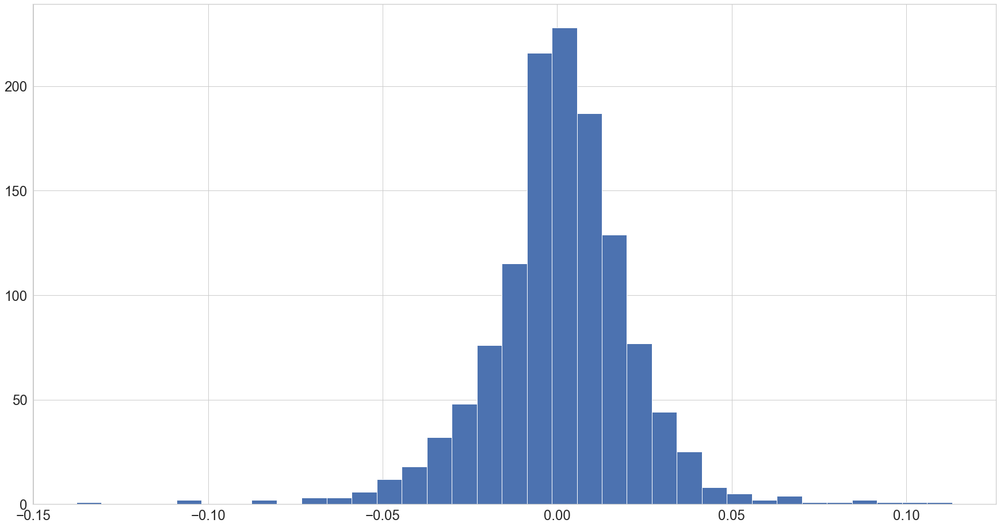

In [ ]:
plt.figure(figsize=(30,16))
plt.hist(apple_stock['log_returns'], bins=35)
plt.xticks(size=24)
plt.yticks(size=24)
plt.show()

In [ ]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    vertical_spacing=0.1, subplot_titles=('Apple', 'Volume'),
                    row_width=[0.2, 0.7])

fig.add_trace(go.Candlestick(x=apple_stock.index, open=apple_stock['Open'], high=apple_stock['High'], low=apple_stock['Low'],
                             close=apple_stock['Close'], name='OHLC'), row=1, col=1)
fig.add_trace(go.Scatter(x=apple_stock.index, y=apple_stock['MA50'], marker_color='grey', name='MA50'), row=1, col=1)
fig.add_trace(go.Scatter(x=apple_stock.index, y=apple_stock['MA200'], marker_color='lightgrey', name='MA200'), row=1, col=1)
fig.add_trace(go.Bar(x=apple_stock.index, y=apple_stock['Volume'], marker_color='red', showlegend=False), row=2, col=1)

fig.update_layout(title='Apple historical price chart', xaxis_tickfont_size=12, yaxis= dict(title='Price($/share)',
                                                                                        titlefont_size=14,
                                                                                        tickfont_size=12),
                    autosize = False, width=1000, height=700, margin=dict(l=50, r=50, b=100, t=100, pad=5),
                    paper_bgcolor='LightSteelBlue')
fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

In [ ]:
colors=px.colors.qualitative.Plotly
temp = dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), width=800))

apple_stock_date=apple_stock.Date.unique()
returns=apple_stock.groupby('Date')['Return'].mean().mul(100).rename('Average Return')
close_avg=apple_stock.groupby('Date')['Close'].mean().rename('Closing Price')
vol_avg=apple_stock.groupby('Date')['Volume'].mean().rename('Volume')

fig = make_subplots(rows=3, cols=1, 
                    shared_xaxes=True)
for i, j in enumerate([returns, close_avg, vol_avg]):
    fig.add_trace(go.Scatter(x=apple_stock_date, y=j, mode='lines',
                             name=j.name, marker_color=colors[i]), row=i+1, col=1)
fig.update_xaxes(rangeslider_visible=False,
                 rangeselector=dict(
                     buttons=list([
                         dict(count=6, label="6m", step="month", stepmode="backward"),
                         dict(count=1, label="1y", step="year", stepmode="backward"),
                         dict(count=2, label="2y", step="year", stepmode="backward"),
                         dict(step="all")])),
                 row=1,col=1)
fig.update_layout(template=temp,title='Apple Market Average Stock Return, Closing Price, and Shares Traded', 
                  hovermode='x unified', height=700, 
                  yaxis1=dict(title='Stock Return', ticksuffix='%'), 
                  yaxis2_title='Closing Price', yaxis3_title='Shares Traded',
                  showlegend=False)
fig.show()

In [ ]:
apple_stock_date=apple_stock.Date.unique()
open_avg=apple_stock.groupby('Date')['Open'].mean()
high_avg=apple_stock.groupby('Date')['High'].mean()
low_avg=apple_stock.groupby('Date')['Low'].mean()
close_avg=apple_stock.groupby('Date')['Close'].mean() 
buttons=[]

fig = go.Figure()
for i in range(18):
    if i != 0:
        open_avg=apple_stock.groupby('Date')['Open'].mean()
        high_avg=apple_stock.groupby('Date')['High'].mean()
        low_avg=apple_stock.groupby('Date')['Low'].mean()
        close_avg=apple_stock.groupby('Date')['Close'].mean()        
    
    fig.add_trace(go.Candlestick(x=apple_stock_date, open=open_avg, high=high_avg,
                                 low=low_avg, close=close_avg,
                                 visible=(True if i==0 else False)))
    
fig.update_xaxes(rangeslider_visible=True,
                 rangeselector=dict(
                     buttons=list([
                         dict(count=3, label="3m", step="month", stepmode="backward"),
                         dict(count=6, label="6m", step="month", stepmode="backward"),
                         dict(step="all")]), xanchor='left',yanchor='bottom', y=1.16, x=.01))
fig.update_layout(template=temp,title='Stock Price Movements', 
                  hovermode='x unified', showlegend=False, width=1000,
                  updatemenus=[dict(active=0, type="dropdown",
                                    buttons=buttons, xanchor='left',
                                    yanchor='bottom', y=1.01, x=.01)],
                  yaxis=dict(title='Stock Price'))
fig.show()

In [ ]:
apple_stock['Date'] = pd.to_datetime(apple_stock['Date'])
apple_stock

,Date,Open,High,Low,Close,Adj Close,Volume,P_mean,P_sum,twt_count,pos,neg,neutral,Return,log_returns,daily_std,annualized_vol,MA50,MA200
0,2018-01-02,42.540001,43.075001,42.314999,43.064999,40.950489,102223600,-0.093750,-3,32,1,4,27,0.000000,0.000000,0.021115,33.519579,43.064999,43.064999
1,2018-01-03,43.132500,43.637501,42.990002,43.057499,40.943359,118071600,-0.060000,-3,50,3,6,41,-0.000174,-0.000174,0.021115,33.519579,43.061249,43.061249
2,2018-01-04,43.134998,43.367500,43.020000,43.257500,41.133537,89738400,-0.176471,-6,34,1,7,26,0.004645,0.004634,0.021115,33.519579,43.126666,43.126666
3,2018-01-05,43.360001,43.842499,43.262501,43.750000,41.601860,94640000,-0.068966,-2,29,4,6,19,0.011385,0.011321,0.021115,33.519579,43.282499,43.282499
4,2018-01-08,43.587502,43.902500,43.482498,43.587502,41.447342,82271200,-0.086957,-4,46,2,6,38,-0.003714,-0.003721,0.021115,33.519579,43.343500,43.343500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,2022-12-12,142.699997,144.500000,141.059998,144.490005,144.490005,70462700,-0.066667,-4,60,0,4,56,0.016390,0.016257,0.021115,33.519579,145.277799,153.326050
1246,2022-12-13,149.500000,149.970001,144.240005,145.470001,145.470001,93886200,-0.039474,-3,76,3,6,67,0.006782,0.006760,0.021115,33.519579,145.338199,153.227800
1247,2022-12-14,145.350006,146.660004,141.160004,143.210007,143.210007,82291200,-0.046875,-3,64,2,5,57,-0.015536,-0.015658,0.021115,33.519579,145.280399,153.127850
1248,2022-12-15,141.110001,141.800003,136.029999,136.500000,136.500000,98931900,0.024390,2,82,9,7,66,-0.046854,-0.047988,0.021115,33.519579,145.082400,152.977550


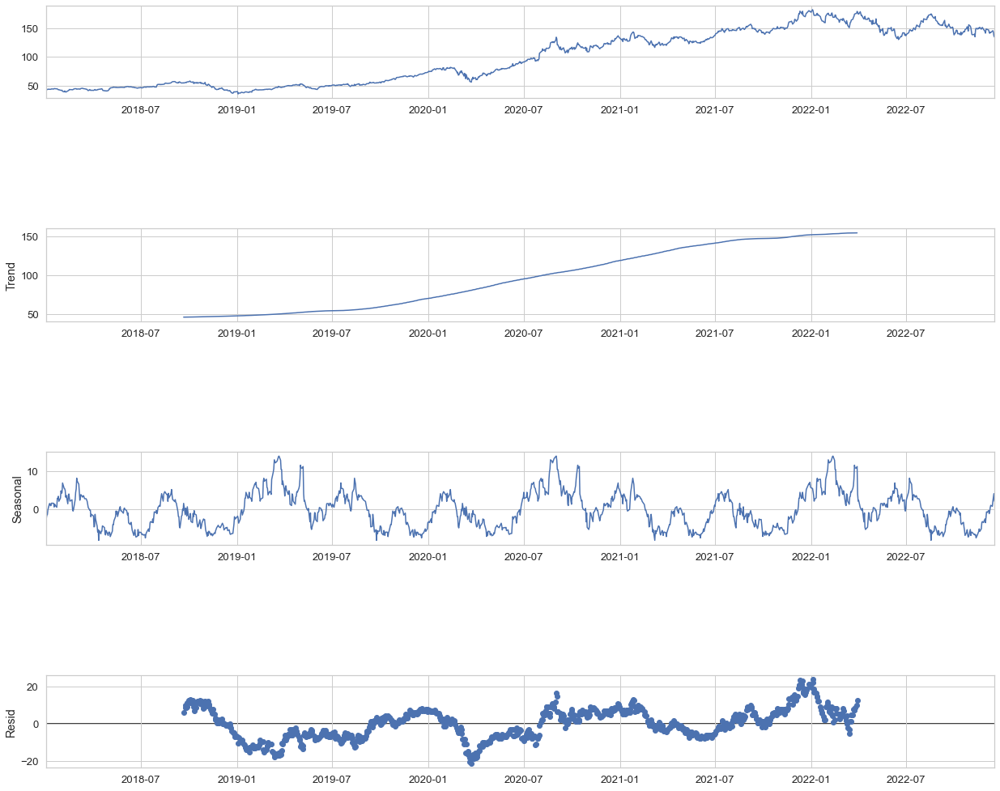

In [ ]:
apple_stock_close = apple_stock[['Date', 'Close']].copy()
apple_stock_close = apple_stock_close.set_index('Date')

decomp = sm(apple_stock_close, period=365)
fig = decomp.plot()
fig.set_size_inches(20, 16)

In [ ]:
figs = make_subplots(rows=6, cols=1, 
                    subplot_titles=("Opening Price", "Closing Price", "Highest Price", 
                                    "Lowest Price", "Adjusted Closing Price", "Volume"))

figs.add_trace(go.Scatter(x=apple_stock.index, y=apple_stock["Open"]), row=1, col=1)
figs.add_trace(go.Scatter(x=apple_stock.index, y=apple_stock["Close"]), row=2, col=1)
figs.add_trace(go.Scatter(x=apple_stock.index, y=apple_stock["High"]), row=3, col=1)
figs.add_trace(go.Scatter(x=apple_stock.index, y=apple_stock["Low"]), row=4, col=1)
figs.add_trace(go.Scatter(x=apple_stock.index, y=apple_stock["Adj Close"]), row=5, col=1)
figs.add_trace(go.Scatter(x=apple_stock.index, y=apple_stock["Volume"]), row=6, col=1)
figs.update_layout(showlegend=False, height=1200, width=800)
figs.show()

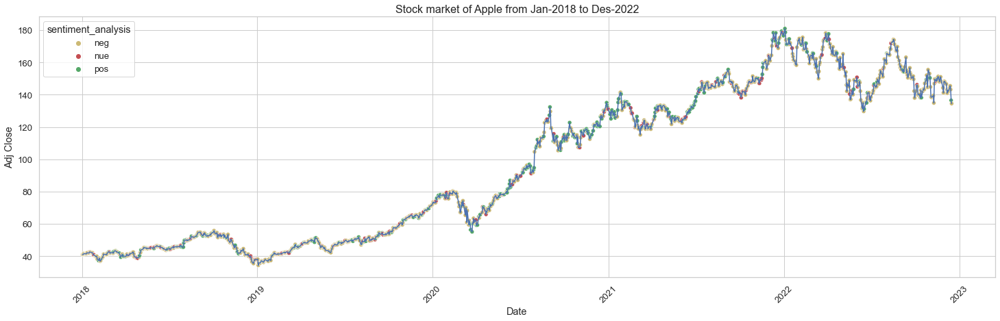

In [ ]:
import seaborn as sns
plt.figure(figsize=(25,7));
sns.lineplot(x=apple_stock["Date"],y=apple_stock["Adj Close"])
apple_stock['sentiment_analysis']=apple_stock['P_mean']
apple_stock['sentiment_analysis']=apple_stock['sentiment_analysis'].apply(lambda x: 'pos' if x>0 else 'nue' if x==0 else 'neg')
sns.scatterplot(x=apple_stock["Date"],y=apple_stock['Adj Close'],hue=apple_stock['sentiment_analysis'],palette=['y','r','g'])
plt.xticks(rotation=45);
plt.title("Stock market of Apple from Jan-2018 to Des-2022",fontsize=16);

In [ ]:
apple_stock

,Date,Open,High,Low,Close,Adj Close,Volume,P_mean,P_sum,twt_count,pos,neg,neutral,Return,log_returns,daily_std,annualized_vol,MA50,MA200,sentiment_analysis
0,2018-01-02,42.540001,43.075001,42.314999,43.064999,40.950489,102223600,-0.093750,-3,32,1,4,27,0.000000,0.000000,0.021115,33.519579,43.064999,43.064999,neg
1,2018-01-03,43.132500,43.637501,42.990002,43.057499,40.943359,118071600,-0.060000,-3,50,3,6,41,-0.000174,-0.000174,0.021115,33.519579,43.061249,43.061249,neg
2,2018-01-04,43.134998,43.367500,43.020000,43.257500,41.133537,89738400,-0.176471,-6,34,1,7,26,0.004645,0.004634,0.021115,33.519579,43.126666,43.126666,neg
3,2018-01-05,43.360001,43.842499,43.262501,43.750000,41.601860,94640000,-0.068966,-2,29,4,6,19,0.011385,0.011321,0.021115,33.519579,43.282499,43.282499,neg
4,2018-01-08,43.587502,43.902500,43.482498,43.587502,41.447342,82271200,-0.086957,-4,46,2,6,38,-0.003714,-0.003721,0.021115,33.519579,43.343500,43.343500,neg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,2022-12-12,142.699997,144.500000,141.059998,144.490005,144.490005,70462700,-0.066667,-4,60,0,4,56,0.016390,0.016257,0.021115,33.519579,145.277799,153.326050,neg
1246,2022-12-13,149.500000,149.970001,144.240005,145.470001,145.470001,93886200,-0.039474,-3,76,3,6,67,0.006782,0.006760,0.021115,33.519579,145.338199,153.227800,neg
1247,2022-12-14,145.350006,146.660004,141.160004,143.210007,143.210007,82291200,-0.046875,-3,64,2,5,57,-0.015536,-0.015658,0.021115,33.519579,145.280399,153.127850,neg
1248,2022-12-15,141.110001,141.800003,136.029999,136.500000,136.500000,98931900,0.024390,2,82,9,7,66,-0.046854,-0.047988,0.021115,33.519579,145.082400,152.977550,pos


In [ ]:
apple_stock.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'P_mean',
       'P_sum', 'twt_count', 'pos', 'neg', 'neutral', 'Return', 'log_returns',
       'daily_std', 'annualized_vol', 'MA50', 'MA200', 'sentiment_analysis'],
      dtype='object')

## ANALYSIS FOR EDA

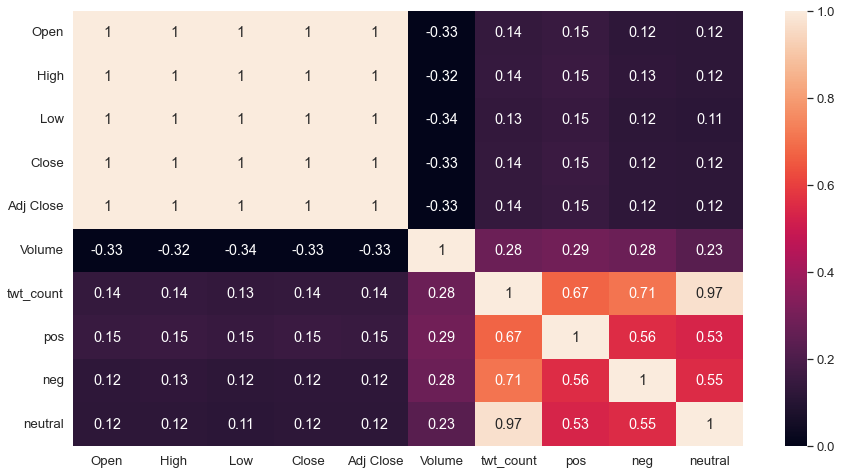

In [ ]:
full_year = apple_stock[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'twt_count', 'pos', 'neg', 'neutral']].corr(method='pearson')
# full_year = full_year.corr(method='pearson')
fig,ax = plt.subplots(figsize=[15,8])
ax = sns.heatmap(full_year,annot=True, vmin=0, vmax=1)
plt.show()

mengecek pertahun

In [ ]:
analyze = apple_stock.copy() 
year = pd.to_datetime(analyze.Date).dt.year
month = pd.to_datetime(analyze.Date).dt.month
analyze = analyze[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'twt_count', 'pos', 'neg', 'neutral']]
analyze

,Open,High,Low,Close,Adj Close,Volume,twt_count,pos,neg,neutral
0,42.540001,43.075001,42.314999,43.064999,40.950489,102223600,32,1,4,27
1,43.132500,43.637501,42.990002,43.057499,40.943359,118071600,50,3,6,41
2,43.134998,43.367500,43.020000,43.257500,41.133537,89738400,34,1,7,26
3,43.360001,43.842499,43.262501,43.750000,41.601860,94640000,29,4,6,19
4,43.587502,43.902500,43.482498,43.587502,41.447342,82271200,46,2,6,38
...,...,...,...,...,...,...,...,...,...,...
1245,142.699997,144.500000,141.059998,144.490005,144.490005,70462700,60,0,4,56
1246,149.500000,149.970001,144.240005,145.470001,145.470001,93886200,76,3,6,67
1247,145.350006,146.660004,141.160004,143.210007,143.210007,82291200,64,2,5,57
1248,141.110001,141.800003,136.029999,136.500000,136.500000,98931900,82,9,7,66


### Analyze for 2022 

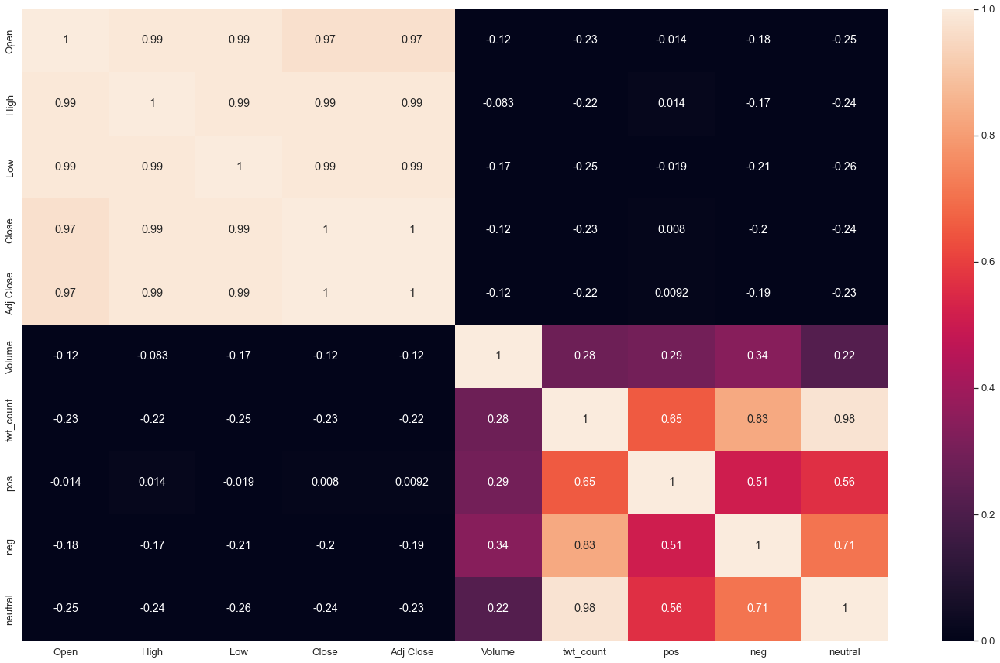

In [ ]:
analyze_2022 = analyze[year == 2022]
corr_2022 = analyze_2022.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(corr_2022,annot=True, vmin=0, vmax=1)
plt.show()

### Analyze for 2021 

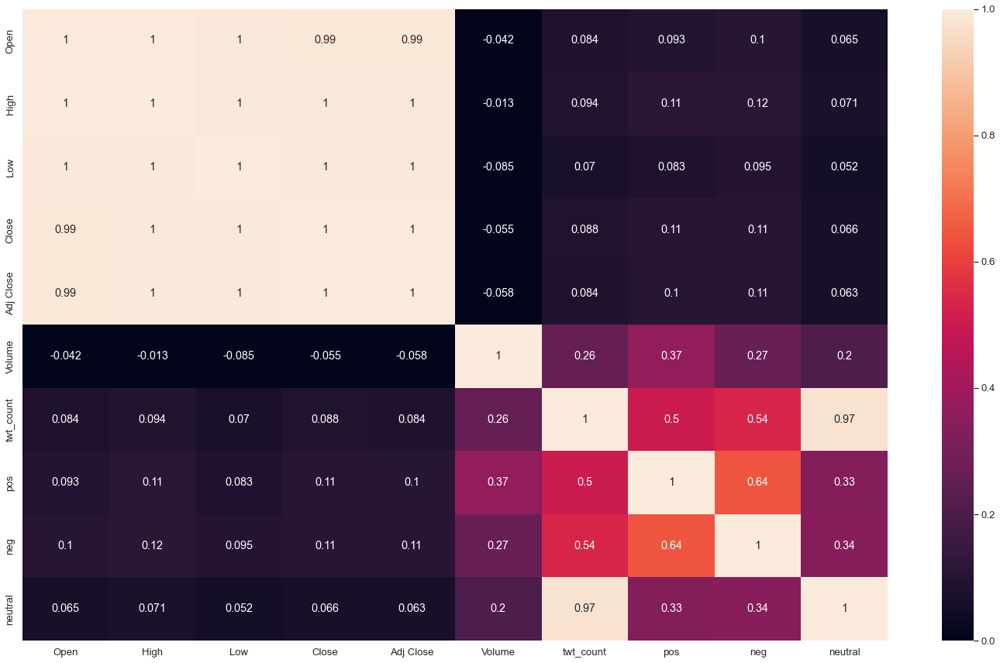

In [ ]:
analyze_2021 = analyze[year == 2021]
corr_2021 = analyze_2021.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(corr_2021,annot=True, vmin=0, vmax=1)
plt.show()

### Analyze for 2020 

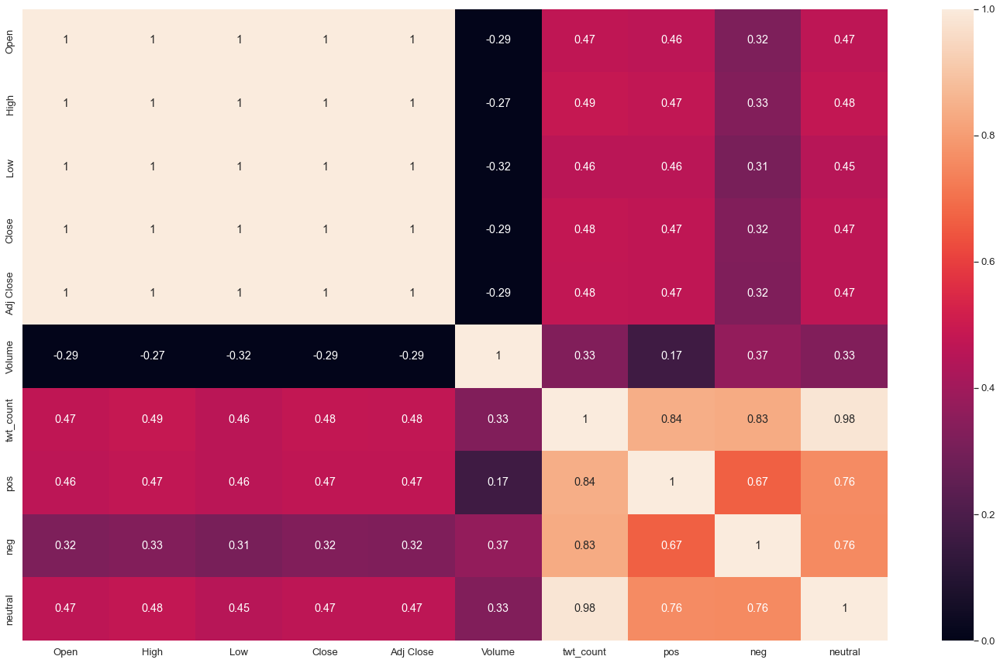

In [ ]:
analyze_2020 = analyze[year == 2020]
corr_2020 = analyze_2020.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(corr_2020,annot=True, vmin=0, vmax=1)
plt.show()

### Analyze for 2019 

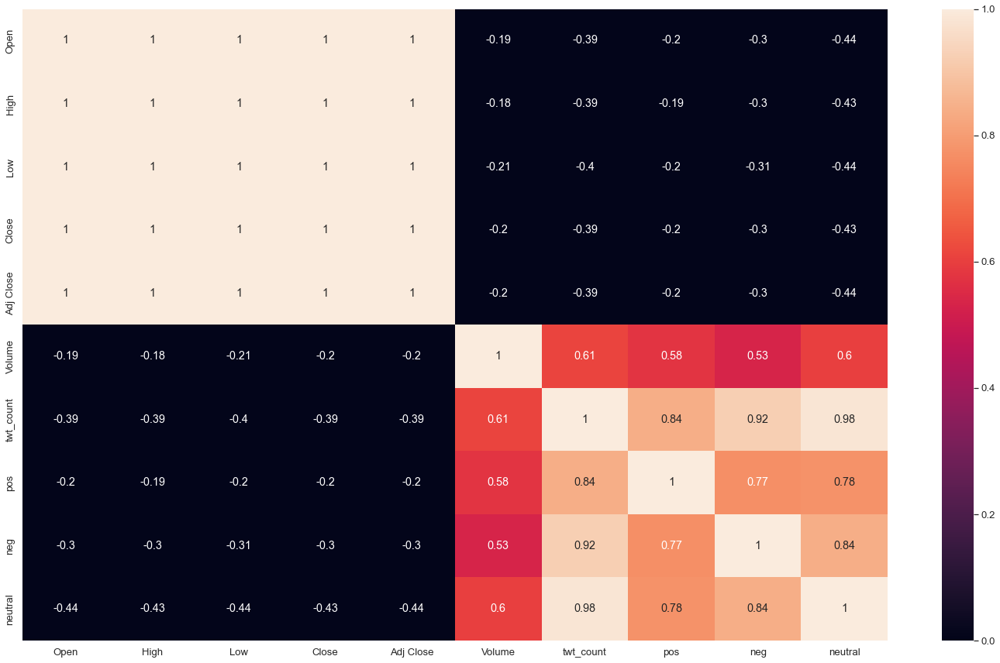

In [ ]:
analyze_2019 = analyze[year == 2019]
corr_2019 = analyze_2019.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(corr_2019,annot=True, vmin=0, vmax=1)
plt.show()

### Analyze for 2018 

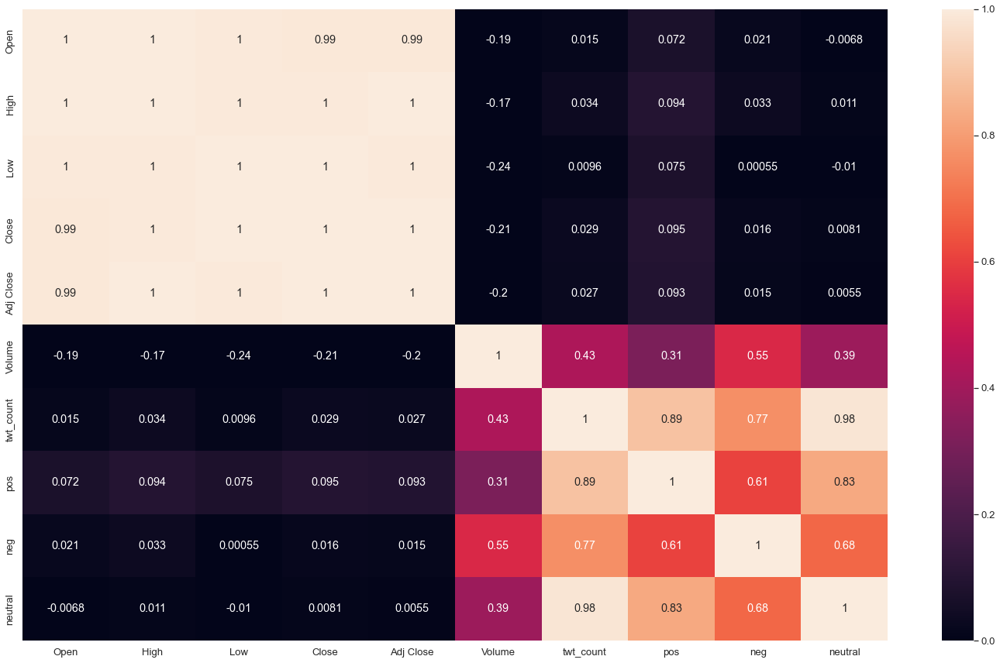

In [ ]:
analyze_2018 = analyze[year == 2018]
corr_2018 = analyze_2018.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(corr_2018,annot=True, vmin=0, vmax=1)
plt.show()

2019 tertinggi nilai korelasinya

In [ ]:
analyze_2019_month1 = analyze_2019[month == 1]
analyze_2019_month2 = analyze_2019[month == 2]
analyze_2019_month3 = analyze_2019[month == 3]
analyze_2019_month4 = analyze_2019[month == 4]
analyze_2019_month5 = analyze_2019[month == 5]
analyze_2019_month6 = analyze_2019[month == 6]
analyze_2019_month7 = analyze_2019[month == 7]
analyze_2019_month8 = analyze_2019[month == 8]
analyze_2019_month9 = analyze_2019[month == 9]
analyze_2019_month10 = analyze_2019[month == 10]
analyze_2019_month11 = analyze_2019[month == 11]
analyze_2019_month12 = analyze_2019[month == 12]

analyze_2019_month1

,Open,High,Low,Close,Adj Close,Volume,twt_count,pos,neg,neutral
251,38.722500,39.712502,38.557499,39.480000,38.105137,148158800,105,9,30,66
252,35.994999,36.430000,35.500000,35.547501,34.309586,365248800,318,31,100,187
253,36.132500,37.137501,35.950001,37.064999,35.774235,234428400,143,17,39,87
254,37.174999,37.207500,36.474998,36.982498,35.694603,219111200,78,4,10,64
255,37.389999,37.955002,37.130001,37.687500,36.375069,164101200,70,3,9,58
256,37.822498,38.632500,37.407501,38.327499,36.992771,180396400,83,8,22,53
257,38.125000,38.492500,37.715000,38.450001,37.111004,143122800,54,3,7,44
258,38.220001,38.424999,37.877499,38.072498,36.746647,108092800,38,2,3,33
259,37.712502,37.817501,37.305000,37.500000,36.194092,129756800,39,1,6,32
260,37.567501,38.347500,37.512501,38.267502,36.934860,114843600,51,3,8,40


#### Januari 2019

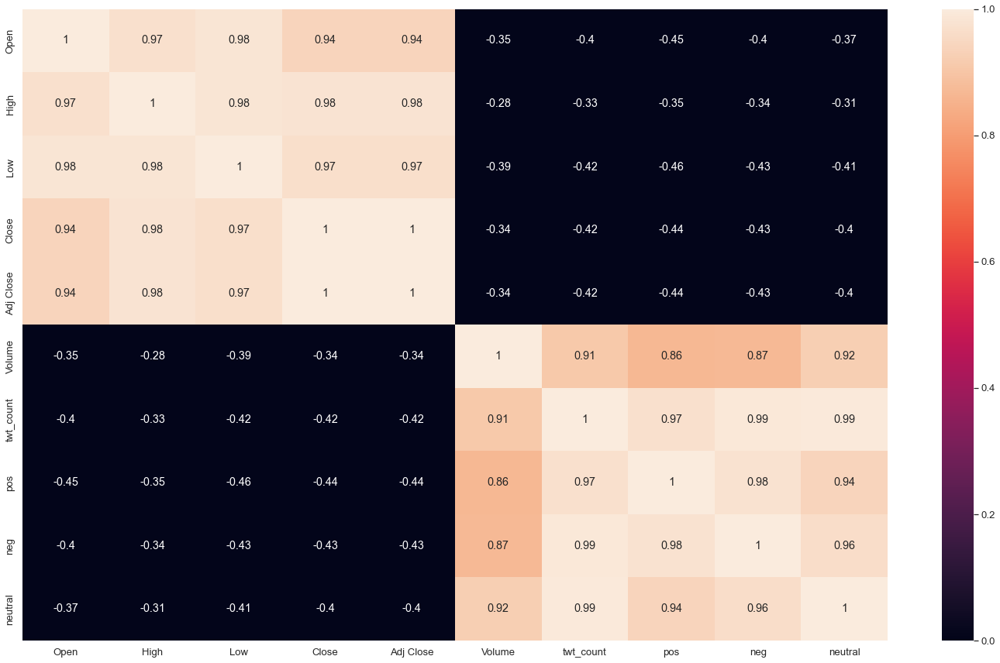

In [ ]:
cor_1 = analyze_2019_month1.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_1,annot=True, vmin=0, vmax=1)
plt.show()

#### Februari 2019

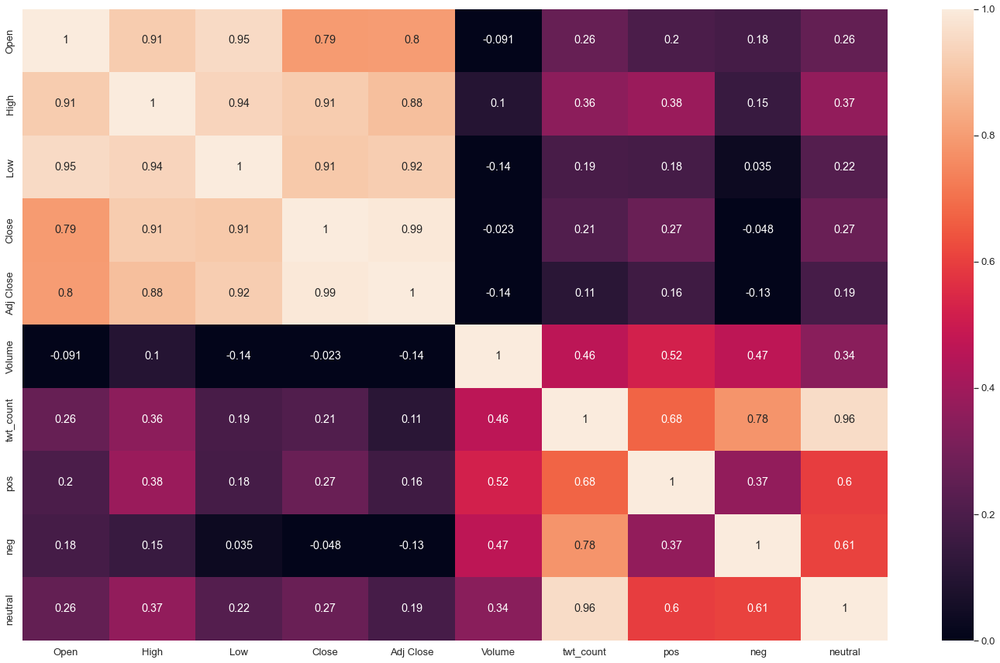

In [ ]:
cor_2 = analyze_2019_month2.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_2,annot=True, vmin=0, vmax=1)
plt.show()

#### Maret 2019

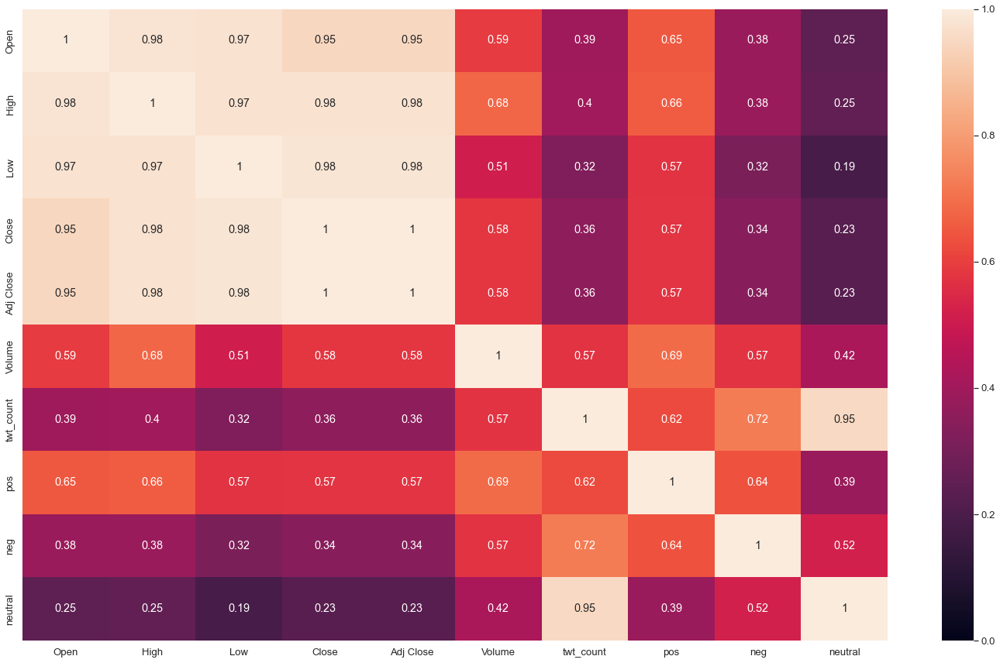

In [ ]:
cor_3 = analyze_2019_month3.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_3,annot=True, vmin=0, vmax=1)
plt.show()

#### April 2019

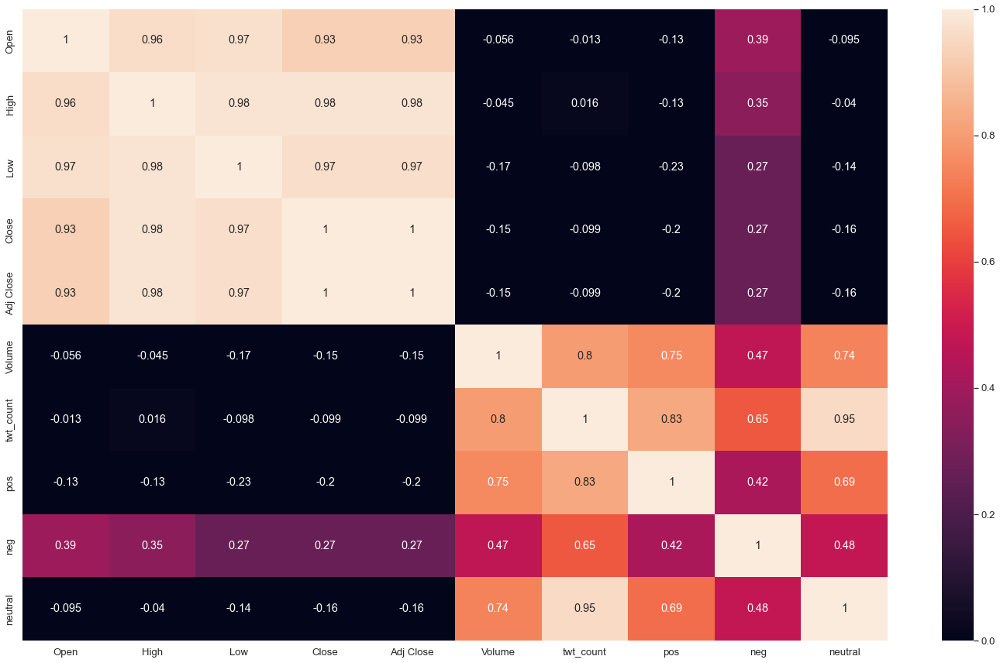

In [ ]:
cor_4 = analyze_2019_month4.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_4,annot=True, vmin=0, vmax=1)
plt.show()

#### Mei 2019

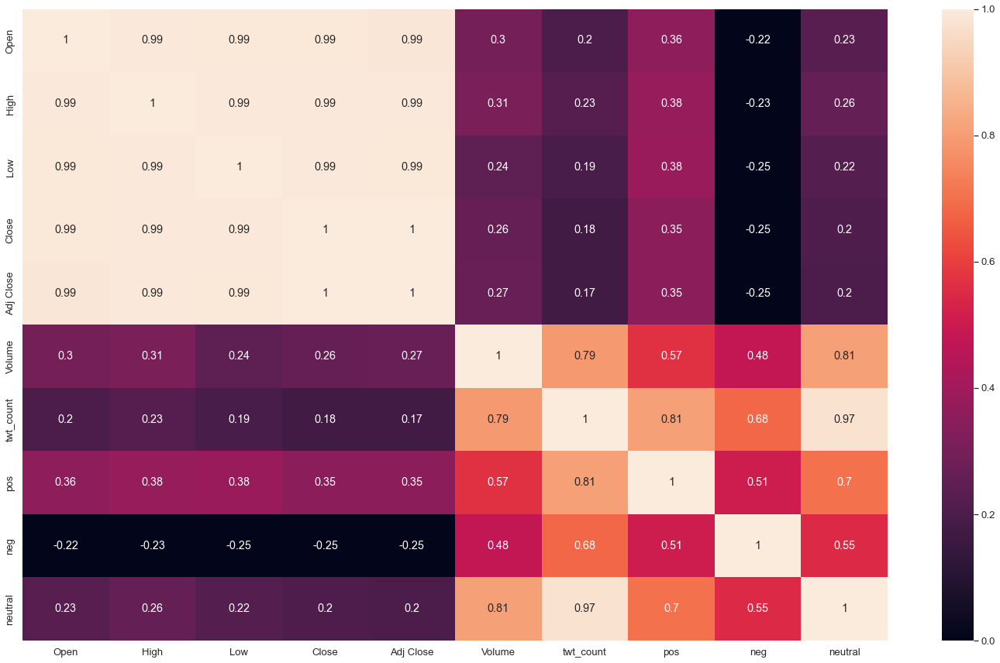

In [ ]:
cor_5 = analyze_2019_month5.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_5,annot=True, vmin=0, vmax=1)
plt.show()

#### Juni 2019

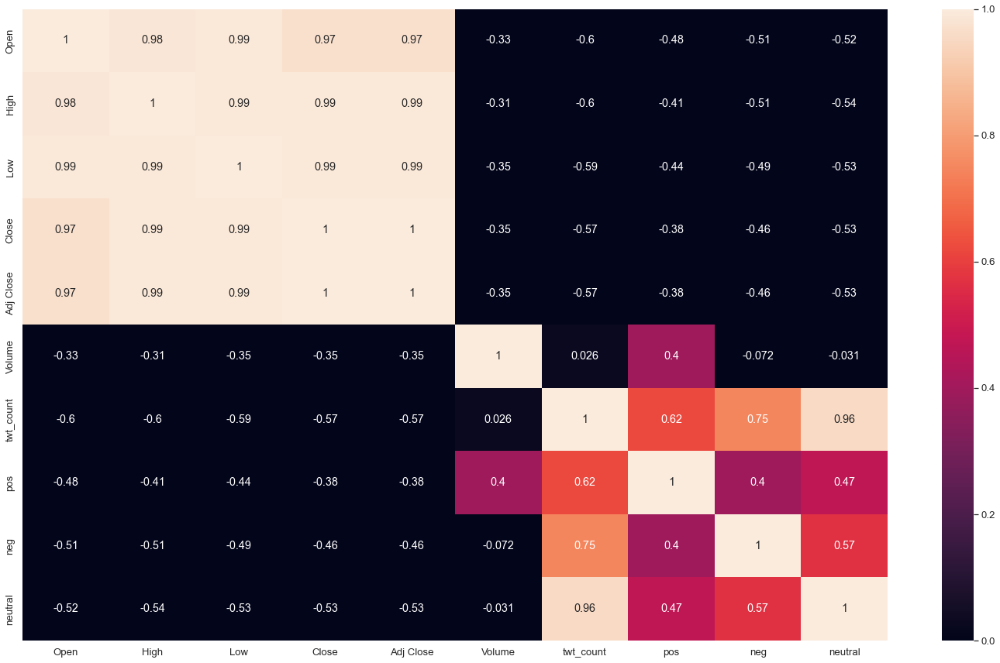

In [ ]:
cor_6 = analyze_2019_month6.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_6,annot=True, vmin=0, vmax=1)
plt.show()

#### July 2019

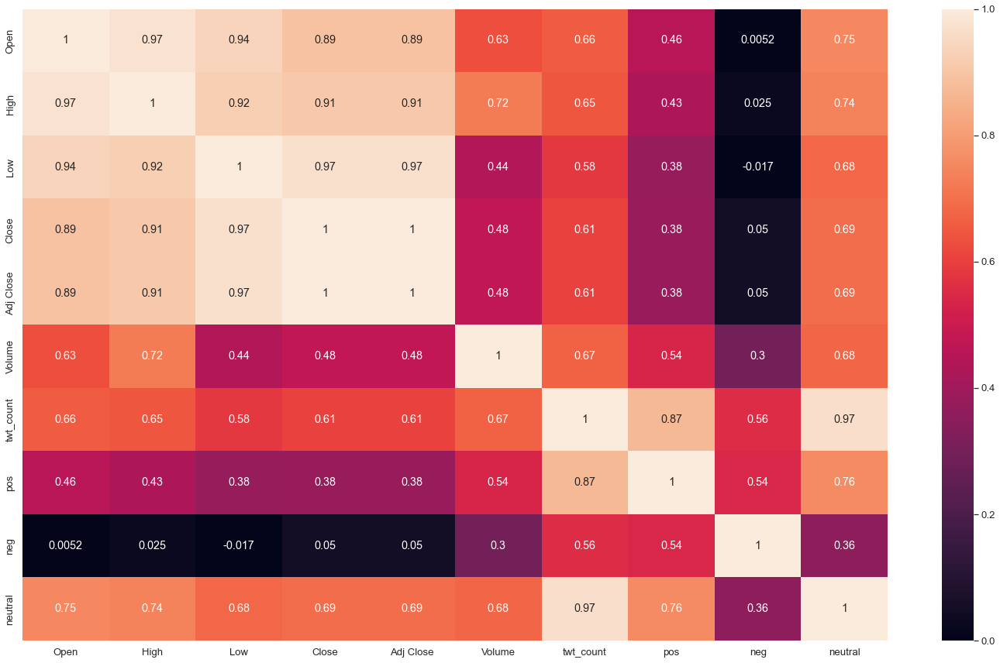

In [ ]:
cor_7 = analyze_2019_month7.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_7,annot=True, vmin=0, vmax=1)
plt.show()

#### August 2019

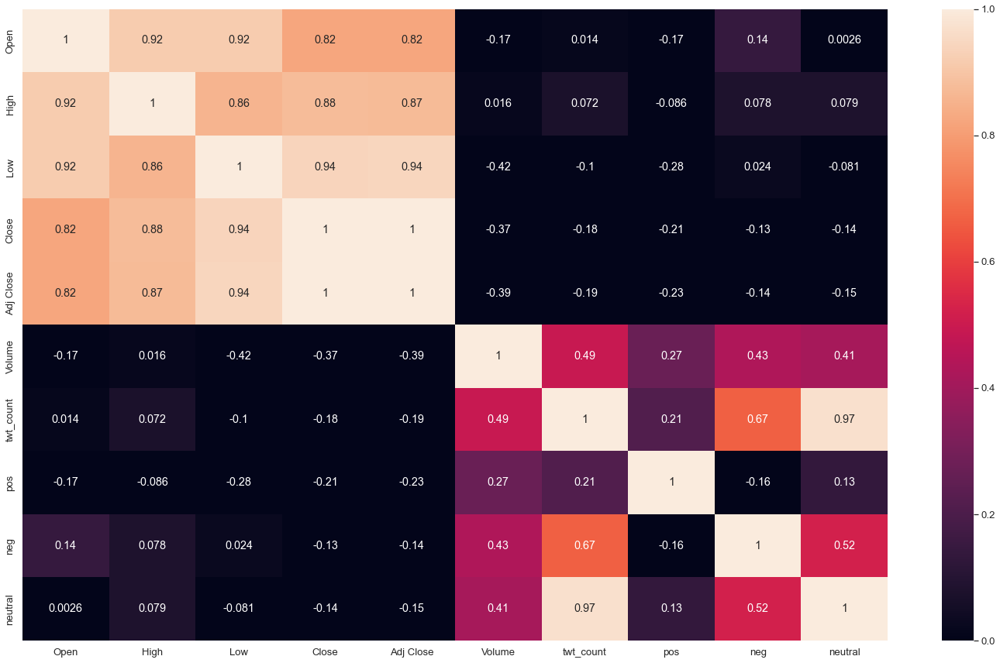

In [ ]:
cor_8 = analyze_2019_month8.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_8,annot=True, vmin=0, vmax=1)
plt.show()

#### September 2019

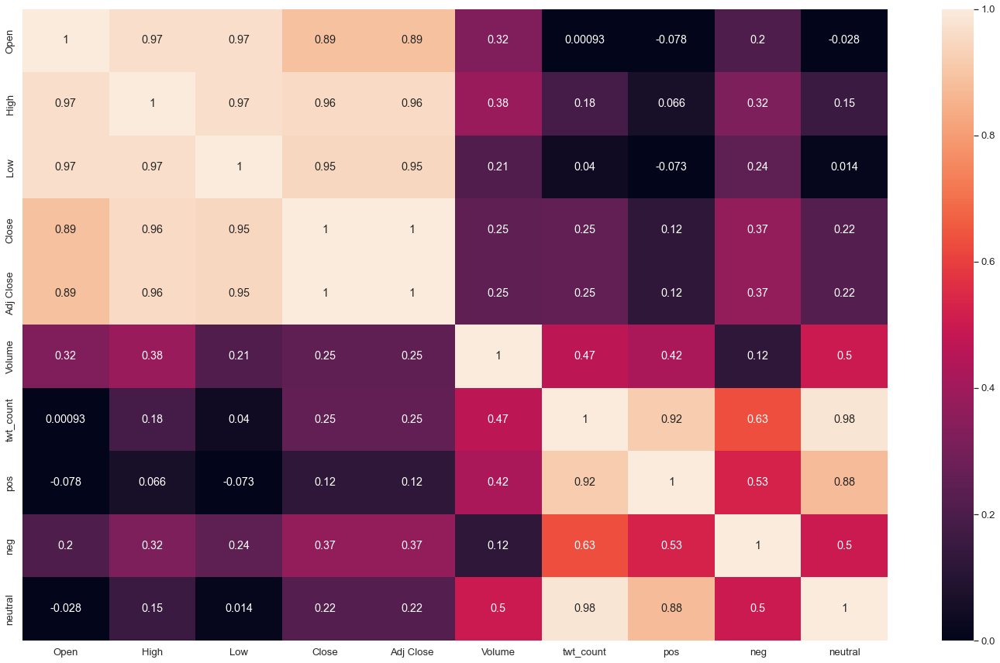

In [ ]:
cor_9 = analyze_2019_month9.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_9,annot=True, vmin=0, vmax=1)
plt.show()

#### October 2019

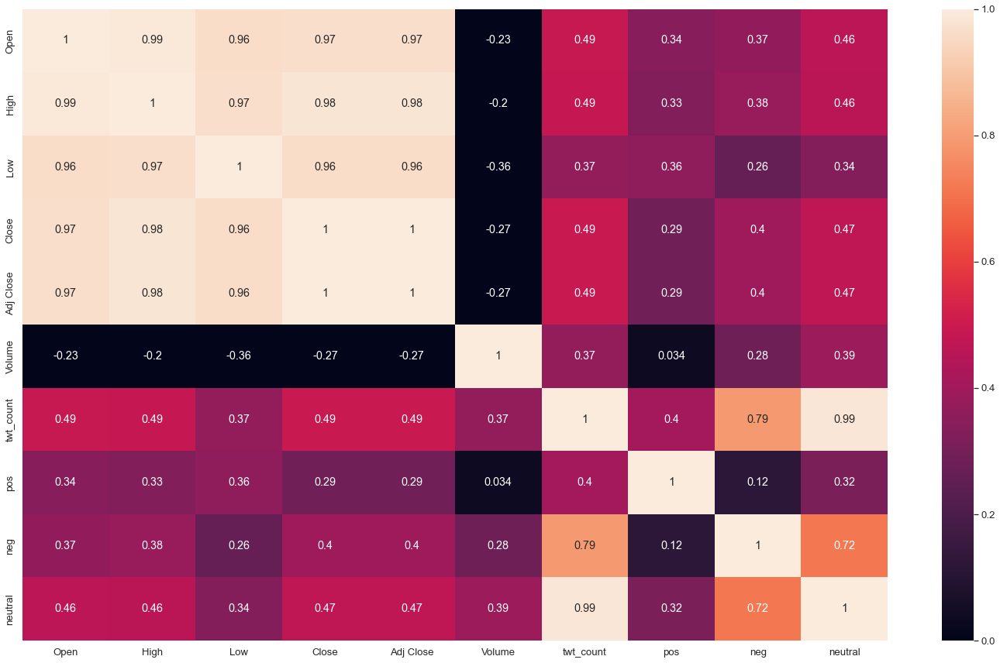

In [ ]:
cor_10 = analyze_2019_month10.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_10,annot=True, vmin=0, vmax=1)
plt.show()

#### November 2019

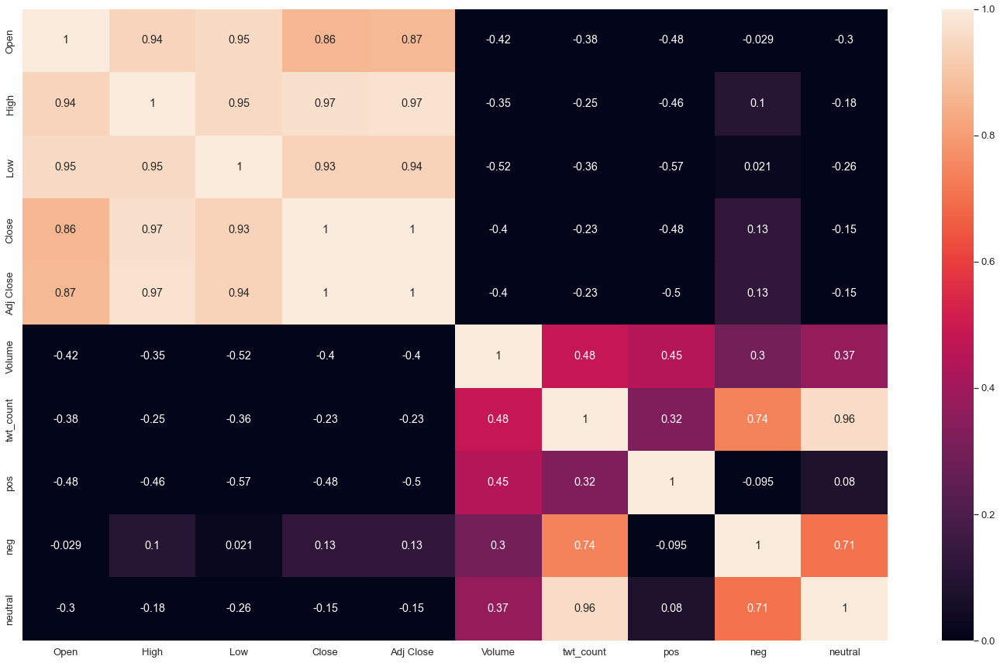

In [ ]:
cor_11 = analyze_2019_month11.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_11,annot=True, vmin=0, vmax=1)
plt.show()

#### December 2019

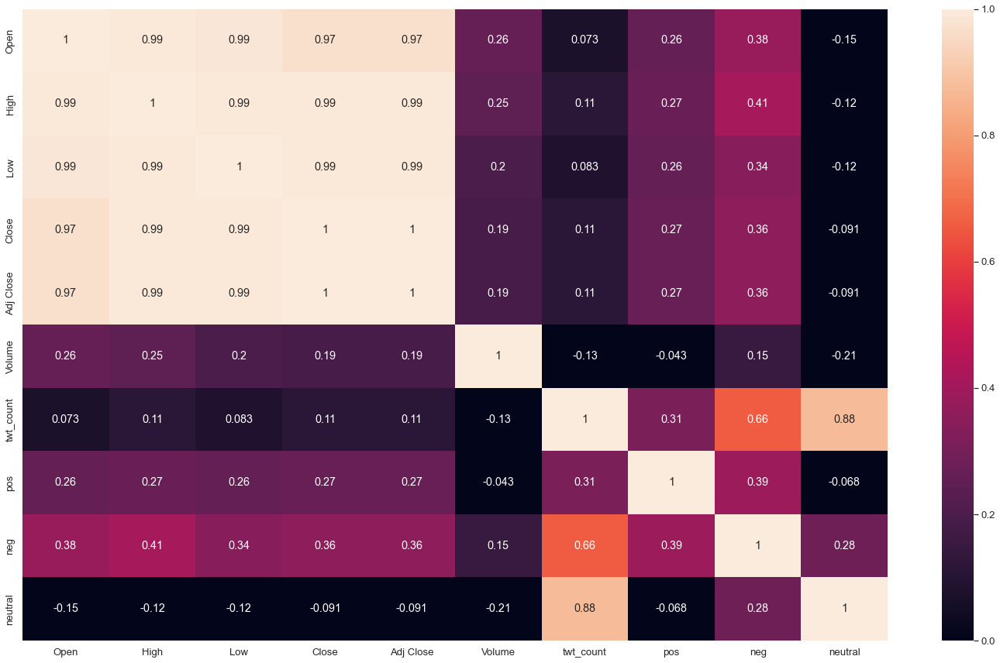

In [ ]:
cor_12 = analyze_2019_month12.corr(method='pearson')
fig,ax = plt.subplots(figsize=[25,15])
ax = sns.heatmap(cor_12,annot=True, vmin=0, vmax=1)
plt.show()

Ternyata bulan 1 sama bulan 3 di 2019 yg tinggi korelasinya

## Melihat percentage change serta melihat korelasi dengan linear regression pada bulan Januari dan Maret 2019

In [ ]:
analyze_2019_month1_pct = analyze_2019_month1.copy()
analyze_2019_month1_pct['volume_pct'] = analyze_2019_month1_pct['Volume'].pct_change()
analyze_2019_month1_pct['twt_count_pct'] = analyze_2019_month1_pct['twt_count'].pct_change()

analyze_2019_month1_pct['volume_pct'].corr(analyze_2019_month1_pct['twt_count_pct'])

0.7632818866342417

Beta:  115.29203896839343
Corr:  0.748254146893762


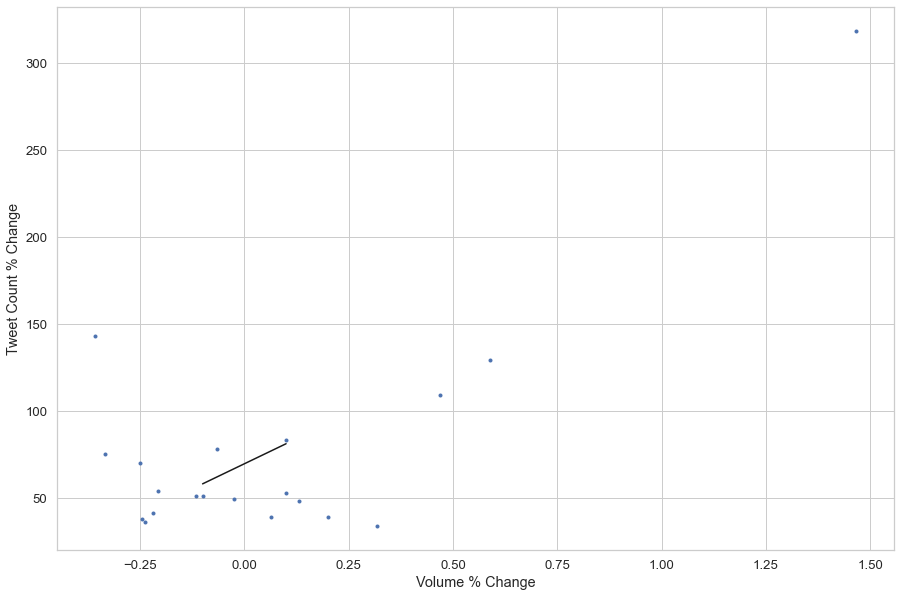

In [ ]:
vol_pct_2019 = analyze_2019_month1_pct['volume_pct'].to_numpy(); vol_pct_2019 = np.delete(vol_pct_2019,0)
twt_pct_2019 = analyze_2019_month1_pct['twt_count'].to_numpy(); twt_pct_2019 = np.delete(twt_pct_2019,0)

plt.figure(figsize=(15,10))
plt.plot(vol_pct_2019, twt_pct_2019, '.')
plt.grid(True)
plt.xlabel('Volume % Change')
plt.ylabel('Tweet Count % Change')

slope, intercept, r_value, p_value, std_err = linregress(vol_pct_2019,twt_pct_2019)
x = np.linspace(-.1,.1)
plt.plot(x, slope * x + intercept, 'k')

print('Beta: ', slope)
print('Corr: ', r_value)

#### maret

In [ ]:
analyze_2019_month3_pct = analyze_2019_month3.copy()
analyze_2019_month3_pct['volume_pct'] = analyze_2019_month3_pct['Volume'].pct_change()
analyze_2019_month3_pct['twt_count_pct'] = analyze_2019_month3_pct['twt_count'].pct_change()

analyze_2019_month3_pct['volume_pct'].corr(analyze_2019_month3_pct['twt_count_pct'])

0.2722694595742409

Beta:  8.91517263813305
Corr:  0.1555755634223794


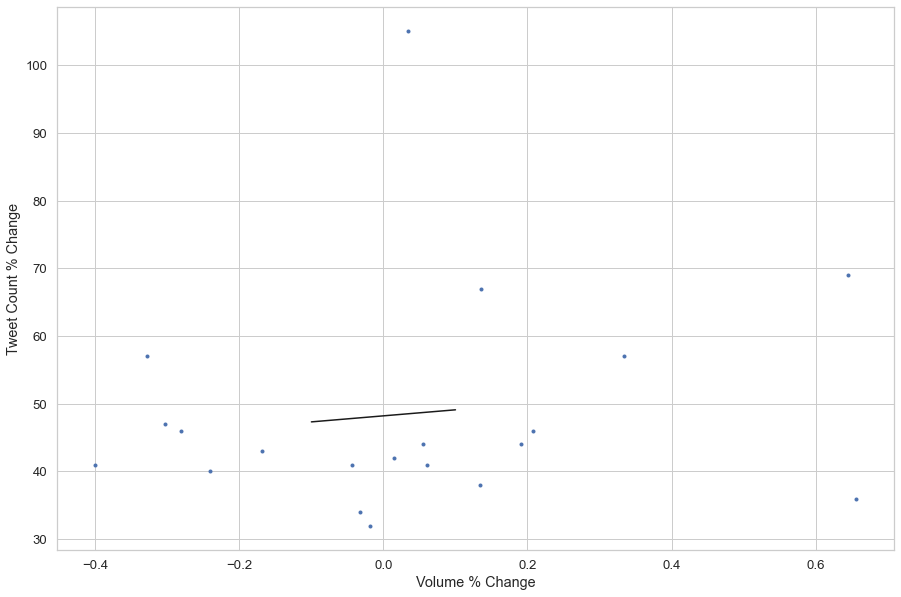

In [ ]:
vol_pct_2019 = analyze_2019_month3_pct['volume_pct'].to_numpy(); vol_pct_2019 = np.delete(vol_pct_2019,0)
twt_pct_2019 = analyze_2019_month3_pct['twt_count'].to_numpy(); twt_pct_2019 = np.delete(twt_pct_2019,0)

plt.figure(figsize=(15,10))
plt.plot(vol_pct_2019, twt_pct_2019, '.')
plt.grid(True)
plt.xlabel('Volume % Change')
plt.ylabel('Tweet Count % Change')

slope, intercept, r_value, p_value, std_err = linregress(vol_pct_2019,twt_pct_2019)
x = np.linspace(-.1,.1)
plt.plot(x, slope * x + intercept, 'k')

print('Beta: ', slope)
print('Corr: ', r_value)

# EDA TWEET SENTIMENT

In [ ]:
df1 = pd.read_csv('polarizedTweets2018.csv')
df2 = pd.read_csv('polarizedTweets2019.csv')
df3 = pd.read_csv('polarizedTweets2020.csv')
df3 = df3[['Date Created', 'Tweet', 'cleaned', 'label', 'Polarity']]
df3.rename(columns={'Date Created':'Date'}, inplace=True)
df4 = pd.read_csv('polarizedTweets2021.csv')
df5 = pd.read_csv('polarizedTweets2022.csv')

In [ ]:
df = pd.concat([df1,df2,df3,df4,df5], axis=0)

In [ ]:
df = df[['Date','cleaned','label']]
df

,Date,cleaned,label
0,2018-12-31 22:20:00+00:00,aapl buy break target tradingview,neutral
1,2018-12-31 21:27:10+00:00,real reason soft apple iphone demand painfully...,negative
2,2018-12-31 21:16:29+00:00,spy qqq dia gdp economy aapl googl,neutral
3,2018-12-31 19:23:15+00:00,group instrument stock etf's hourly chart upda...,neutral
4,2018-12-31 19:21:05+00:00,group instrument hourly chart update member vi...,neutral
...,...,...,...
16236,2022-01-01 05:27:32+00:00,happy new year stay safe everyone let get read...,positive
16237,2022-01-01 03:46:41+00:00,cashappynewyear bobbybrackets wonderful cashap...,positive
16238,2022-01-01 02:45:44+00:00,wrap grateful wonderful people platform contin...,positive
16239,2022-01-01 01:04:39+00:00,freestock aapl tesla limited time offer get fr...,neutral


In [ ]:
#df['Date'] = df['Date'].astype('datetime64[ns]')
df['Date'] = pd.to_datetime(df['Date'])
df

,Date,cleaned,label
0,2018-12-31 22:20:00+00:00,aapl buy break target tradingview,neutral
1,2018-12-31 21:27:10+00:00,real reason soft apple iphone demand painfully...,negative
2,2018-12-31 21:16:29+00:00,spy qqq dia gdp economy aapl googl,neutral
3,2018-12-31 19:23:15+00:00,group instrument stock etf's hourly chart upda...,neutral
4,2018-12-31 19:21:05+00:00,group instrument hourly chart update member vi...,neutral
...,...,...,...
16236,2022-01-01 05:27:32+00:00,happy new year stay safe everyone let get read...,positive
16237,2022-01-01 03:46:41+00:00,cashappynewyear bobbybrackets wonderful cashap...,positive
16238,2022-01-01 02:45:44+00:00,wrap grateful wonderful people platform contin...,positive
16239,2022-01-01 01:04:39+00:00,freestock aapl tesla limited time offer get fr...,neutral


<AxesSubplot:xlabel='label', ylabel='count'>

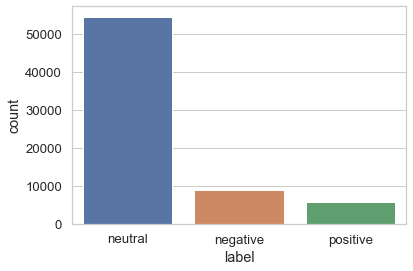

In [ ]:
sns.set(style = "whitegrid" , font_scale = 1.2)
sns.countplot(df.label)

In [ ]:
df.label.replace("positive" , 1 , inplace = True)
df.label.replace("negative" , -1 , inplace = True)
df.label.replace("neutral" , 0 , inplace = True)
df.head()

,Date,cleaned,label
0,2018-12-31 22:20:00+00:00,aapl buy break target tradingview,0
1,2018-12-31 21:27:10+00:00,real reason soft apple iphone demand painfully...,-1
2,2018-12-31 21:16:29+00:00,spy qqq dia gdp economy aapl googl,0
3,2018-12-31 19:23:15+00:00,group instrument stock etf's hourly chart upda...,0
4,2018-12-31 19:21:05+00:00,group instrument hourly chart update member vi...,0


In [ ]:
df['cleaned'] = df['cleaned'].astype(str)

In [ ]:
# menampilkan 20 kata yang sering tersebut
cnt = Counter()
for text in df["cleaned"].values:
    for word in text.split():
        cnt[word] += 1
        
cnt.most_common(20)

[('aapl', 73937),
 ('apple', 22730),
 ('stock', 13928),
 ('tsla', 11482),
 ('spy', 7812),
 ('chart', 7228),
 ('amzn', 6540),
 ('msft', 6071),
 ('market', 5494),
 ('trading', 5429),
 ('price', 5294),
 ('spx', 5056),
 ('day', 5042),
 ('dogecointo', 4918),
 ('wallstreetbets', 4827),
 ('nflx', 4112),
 ('btc', 4051),
 ('get', 3972),
 ('amc', 3965),
 ('trade', 3831)]

In [ ]:
# Menghapus 30 kata yang paling sering disebut
FREQWORDS = set([w for (w, wc) in cnt.most_common(30)])
def remove_freqwords(text):
    """custom function to remove the frequent words"""
    return " ".join([word for word in str(text).split() if word not in FREQWORDS])

df["cleaned"] = df["cleaned"].apply(lambda text: remove_freqwords(text))
df.head()

,Date,cleaned,label
0,2018-12-31 22:20:00+00:00,buy break target tradingview,0
1,2018-12-31 21:27:10+00:00,real reason soft demand painfully obvious via,-1
2,2018-12-31 21:16:29+00:00,dia gdp economy googl,0
3,2018-12-31 19:23:15+00:00,group instrument etf's hourly update member vi...,0
4,2018-12-31 19:21:05+00:00,group instrument hourly update member view ell...,0


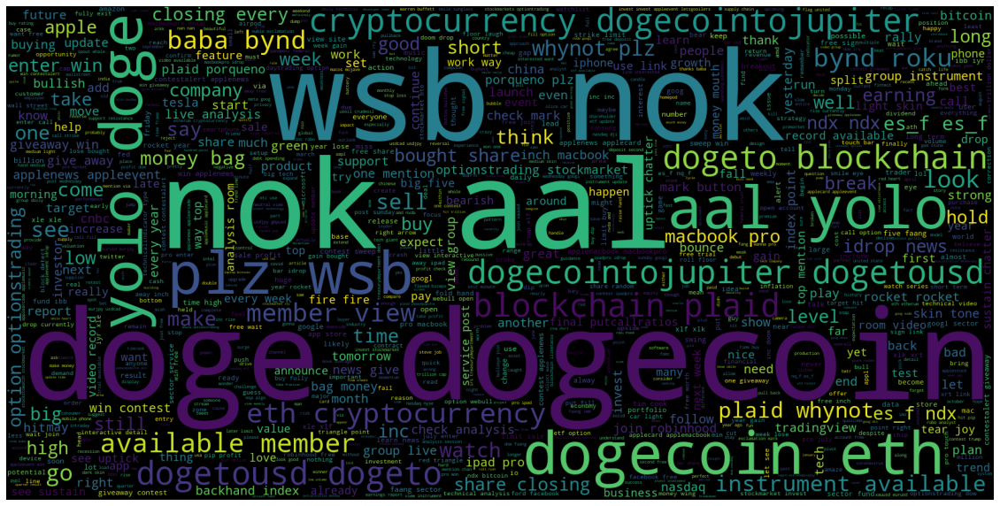

In [ ]:
# Wordcloud untuk semua sentimen dari pada tahun 2018-2022
plt.figure(figsize=(20,20))
#STOPWORDS = set(stopwords.words('english'))
wordcloud = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df.cleaned)))
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

In [ ]:
df_pos = pd.DataFrame(df[df.label==1]['cleaned'])
df_neu = pd.DataFrame(df[df.label==0]['cleaned'])
df_neg = pd.DataFrame(df[df.label==-1]['cleaned'])

### Wordcloud untuk Sentimen positif 2018 - 2022

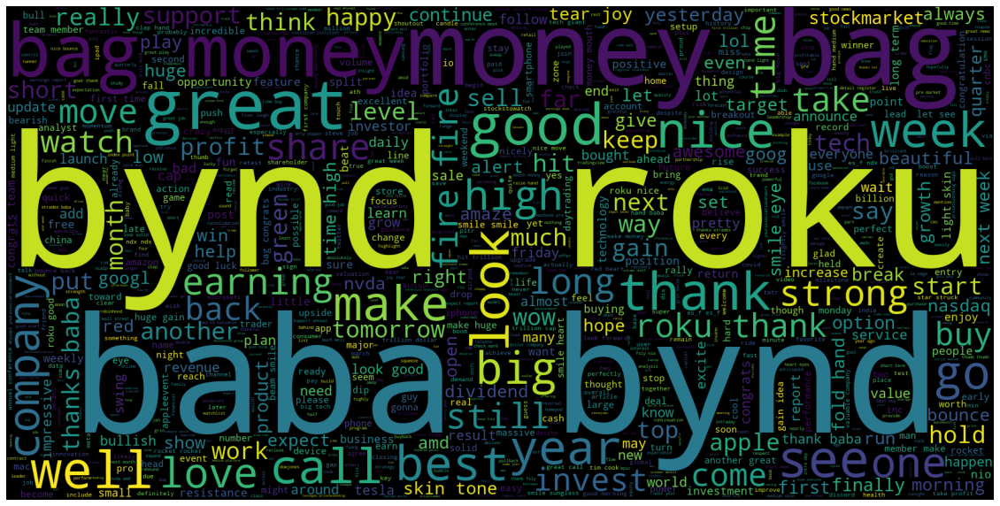

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_pos = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_pos.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_pos)
plt.show()

### Wordcloud untuk Sentimen neutral 2018 - 2022

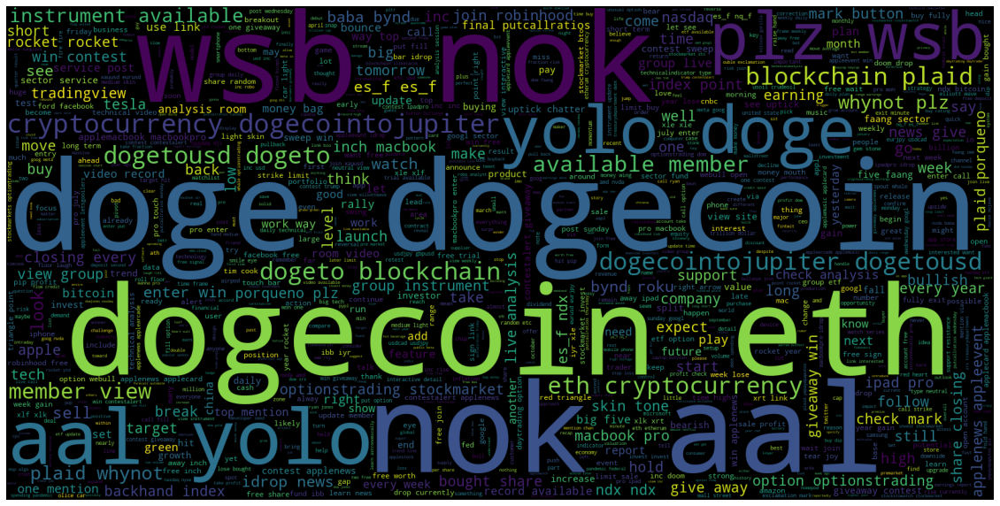

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_pos = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_neu.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_pos)
plt.show()

### Wordcloud untuk Sentimen negatif 2018 - 2022

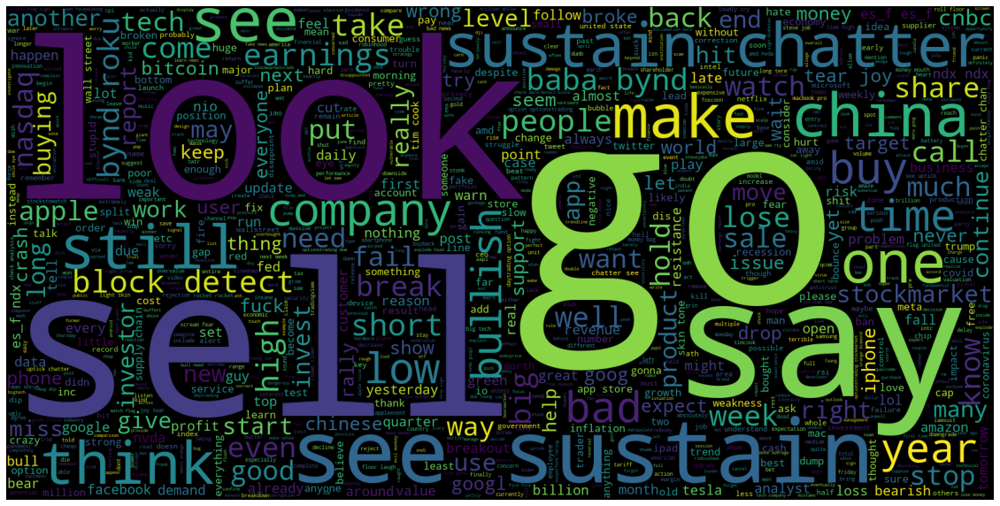

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_pos = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_neg.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_pos)
plt.show()

karena hanya bulan 1 dan bulan 3 pada tahun 2019 yang memiliki korelasi tertinggi jadi EDA sentimentnya menggunakan bulan tersebut

### Bulan Januari dan Bulan Maret 2019

sebelum ini tampilin hasil korelasi dari 5 tahun terus cari salah satu tahun dan telusurin di bulan yang tertinggi

#### Bulan Januari 2019

In [ ]:
df_jan = df[(df['Date'] >= '2019-01-01') & (df['Date'] < '2019-02-01')]
df_jan_pos = pd.DataFrame(df_jan[df_jan.label==1]['cleaned'])
df_jan_neu = pd.DataFrame(df_jan[df_jan.label==0]['cleaned'])
df_jan_neg = pd.DataFrame(df_jan[df_jan.label==-1]['cleaned'])

<AxesSubplot:xlabel='label', ylabel='count'>

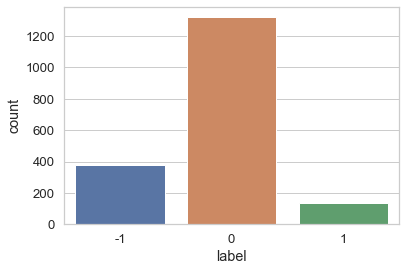

In [ ]:
sns.set(style = "whitegrid" , font_scale = 1.2)
sns.countplot(df_jan.label)

#### Wordcloud untuk Sentimen positif

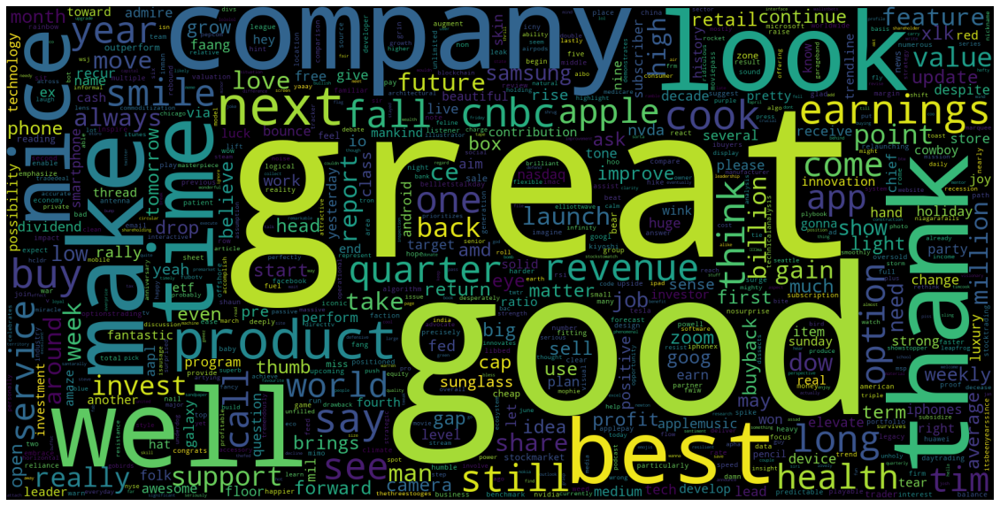

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_pos_j = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_jan_pos.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_pos_j)
plt.show()

#### Wordcloud untuk Sentimen neutral

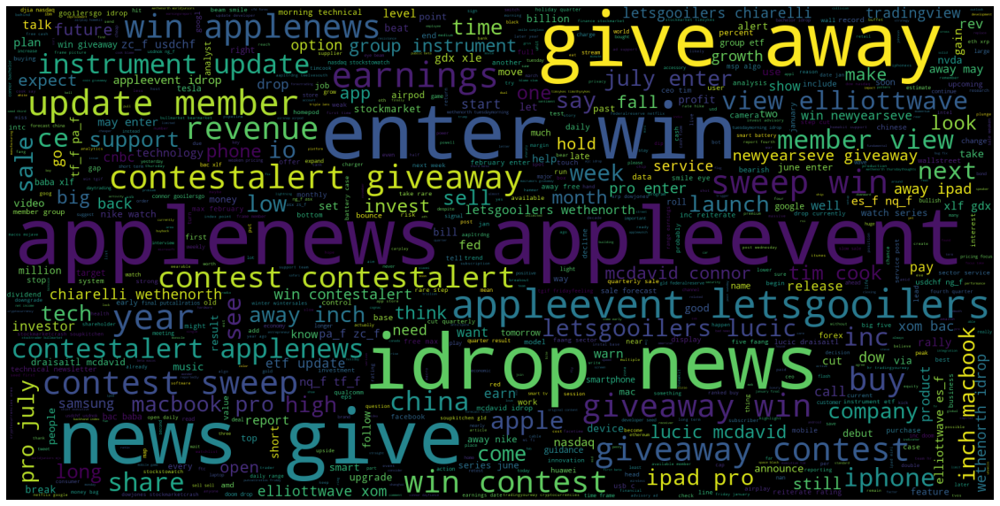

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_pos_l = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_jan_neu.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_pos_l)
plt.show()

#### Wordcloud untuk Sentimen negatif

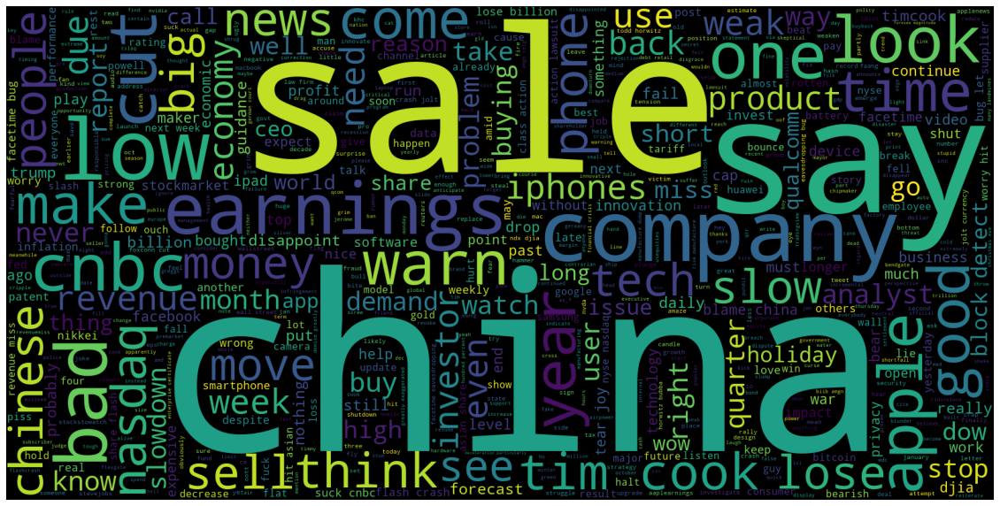

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_pos_n = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_jan_neg.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_pos_n)
plt.show()

### Bulan Maret 2019

In [ ]:
df_mar = df[(df['Date'] >= '2019-03-01') & (df['Date'] < '2019-04-01')]
df_mar_pos = pd.DataFrame(df_mar[df_mar.label==1]['cleaned'])
df_mar_neu = pd.DataFrame(df_mar[df_mar.label==0]['cleaned'])
df_mar_neg = pd.DataFrame(df_mar[df_mar.label==-1]['cleaned'])

<AxesSubplot:xlabel='label', ylabel='count'>

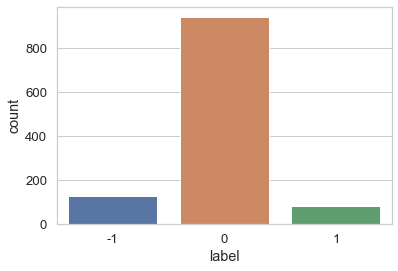

In [ ]:
sns.set(style = "whitegrid" , font_scale = 1.2)
sns.countplot(df_mar.label)

#### Wordcloud untuk Sentimen positif

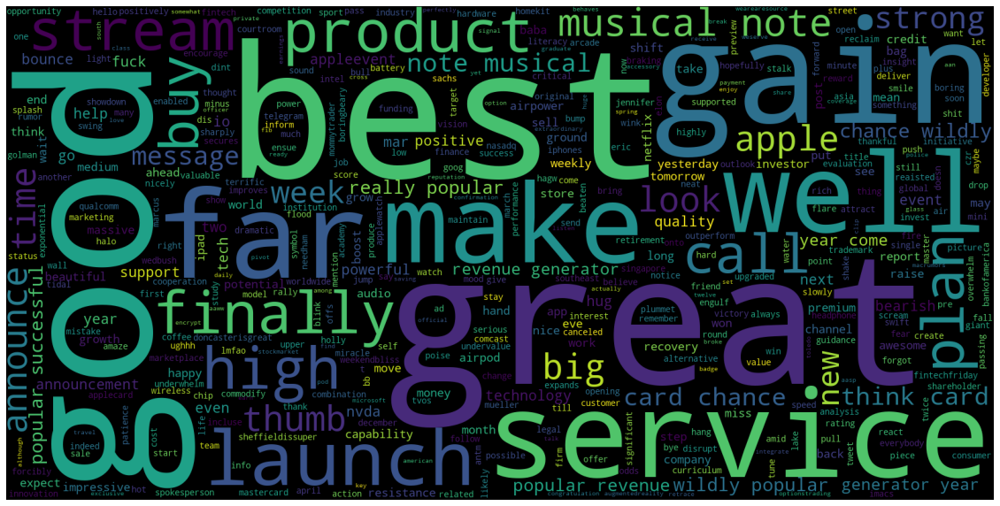

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_mar_p = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_mar_pos.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_mar_p)
plt.show()

#### Wordcloud untuk Sentimen neutral

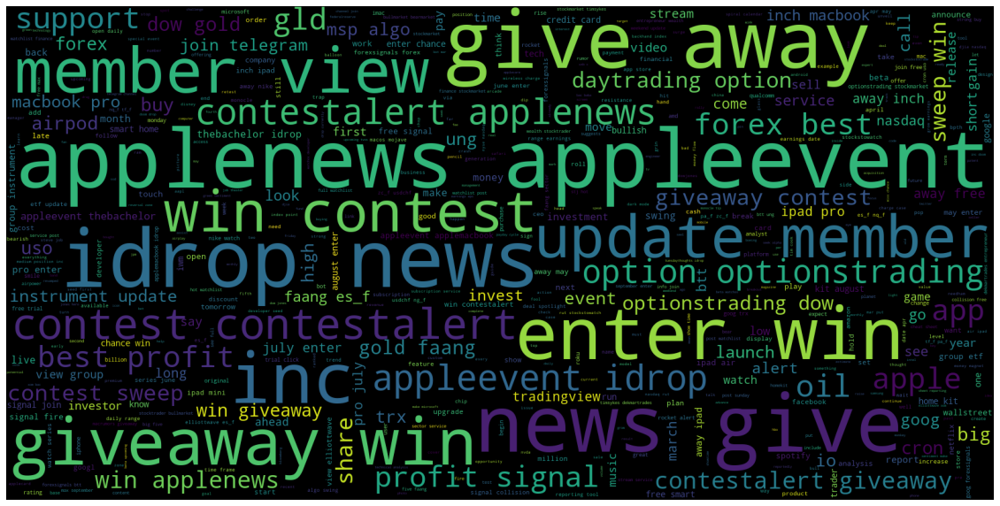

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_mar_l = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_mar_neu.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_mar_l)
plt.show()

#### Wordcloud untuk Sentimen negatif

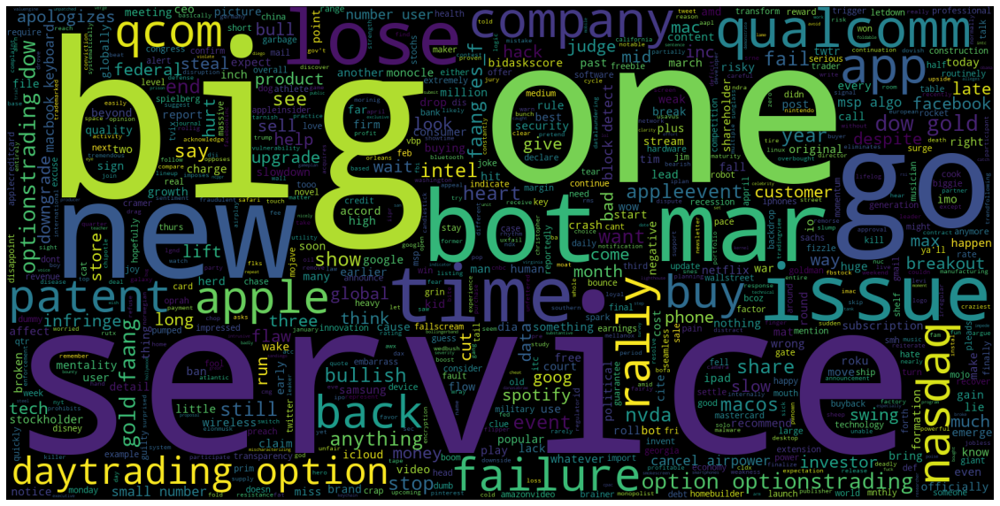

In [ ]:
plt.figure(figsize=(20,20))
wordcloud_mar_n = WordCloud(min_font_size=5, max_words=1000, width=1600 , height=800).generate(str(" ".join(df_mar_neg.cleaned)))
plt.axis('off')
plt.imshow(wordcloud_mar_n)
plt.show()